In [31]:
# Необходимо для корректной работы внешних .py файлов
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import TargetEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from lightgbm import LGBMClassifier
from helper import *
from plots import *
from timeit import default_timer as timer
import random
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from skopt.space import Integer, Real, Categorical
from skopt import BayesSearchCV

In [33]:
# фиксируем состояние генератора псевдослучайных чисел. Это необходимо, чтобы результаты модели не менялись с каждым новым запуском 
SEED = 42 # можно указать любое число
np.random.seed(SEED)
random.seed(SEED)

In [34]:
df = pd.read_csv("data.csv")

## 1. Предобработка

In [35]:
# Общие преобразования
df_preprocessed = df.copy()
df_preprocessed = df_preprocessed.drop(columns=['Loan_ID'])
df_preprocessed['Credit_History'] = df_preprocessed['Credit_History'].fillna(2)
df_preprocessed['Dependents'] = np.where(df_preprocessed['Dependents'] == '3+', 3, df_preprocessed['Dependents'])
df_preprocessed['Dependents'] = pd.to_numeric(df_preprocessed['Dependents'])
df_preprocessed['Loan_Status'] = np.where(df_preprocessed['Loan_Status'] == 'Y', 1, 0)
df_preprocessed['Loan_Amount_Term'] = pd.to_numeric(df_preprocessed['Loan_Amount_Term'])
df_preprocessed['LIR'] = df_preprocessed['LoanAmount'] / (df_preprocessed['ApplicantIncome'] + df_preprocessed['CoapplicantIncome'])

In [36]:
X, y = h.divide_data(df_preprocessed, 'Loan_Status')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED, stratify=y)

In [37]:
categorical_cols = ['Gender', 'Married', 'Education', 'Self_Employed', 'Property_Area']
numeric_cols = ['Dependents', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term', 'Credit_History']
most_frequent_numeric_cols = ['Dependents', 'Loan_Amount_Term']
most_frequent_cat_cols = ['Gender', 'Married', 'Self_Employed']
mean_imputer_cols = ['LoanAmount', 'LIR']
category_orders = [
    ['Male', 'Female'], # gender
    ['No', 'Yes'], # married                         
    ['Not Graduate', 'Graduate'], # education    
    ['No', 'Yes'], # self employed
    ['Rural', 'Semiurban', 'Urban'] # property area        
]

# уже знакомый нам пайплайн
preprocessor = Pipeline([
    ('nan_remover', ColumnTransformer(
        [
            ('most_frequent_numeric', SimpleImputer(strategy='most_frequent'), most_frequent_numeric_cols),
            ('most_frequent_cat', SimpleImputer(strategy='most_frequent'), most_frequent_cat_cols),
            ('mean', SimpleImputer(strategy='mean'), mean_imputer_cols)
        ],
        remainder='passthrough', 
        verbose_feature_names_out=False
    )),
    
    ('transformations', ColumnTransformer(
        [('encoder', TargetEncoder(categories=category_orders), categorical_cols)],
        remainder='passthrough',
        verbose_feature_names_out=False
    ))
])
preprocessor.set_output(transform="pandas")

Pipeline(steps=[('nan_remover',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('most_frequent_numeric',
                                                  SimpleImputer(strategy='most_frequent'),
                                                  ['Dependents',
                                                   'Loan_Amount_Term']),
                                                 ('most_frequent_cat',
                                                  SimpleImputer(strategy='most_frequent'),
                                                  ['Gender', 'Married',
                                                   'Self_Employed']),
                                                 ('mean', SimpleImputer(),
                                                  ['LoanAmount', 'LIR'])],
                                   verbose_feature_names_out=False)),
                ('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('encoder',
                                                  TargetEncoder(categories=[['Male',
                                                                             'Female'],
                                                                            ['No',
                                                                             'Yes'],
                                                                            ['Not '
                                                                             'Graduate',
                                                                             'Graduate'],
                                                                            ['No',
                                                                             'Yes'],
                                                                            ['Rural',
                                                                             'Semiurban',
                                                                             'Urban']]),
                                                  ['Gender', 'Married',
                                                   'Education', 'Self_Employed',
                                                   'Property_Area'])],
                                   verbose_feature_names_out=False))])

In [38]:
base_model = ('LGBMClassifier', LGBMClassifier(random_state=SEED))

In [39]:
preprocessor.steps.append(base_model)
pipeline = preprocessor

[LightGBM] [Info] Number of positive: 337, number of negative: 154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686354 -> initscore=0.783130
[LightGBM] [Info] Start training from score 0.783130
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

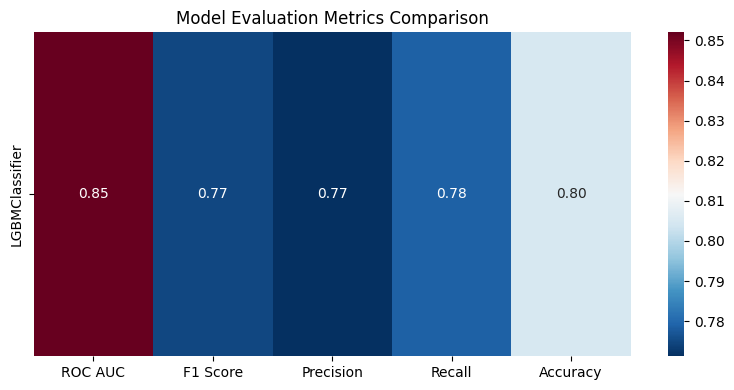

In [40]:
initial_metrics = h.train_evaluate_models(
    models=[('LGBMClassifier', pipeline)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [41]:
initial_metrics

,ROC AUC,F1 Score,Precision,Recall,Accuracy
LGBMClassifier,0.852012,0.774725,0.771235,0.778793,0.804878


## 2. Подбор гиперпараметров

In [42]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

### 2.1 Grid Search

In [43]:
param_grid = {
    # Контроль сложности модели и переобучения
    "LGBMClassifier__num_leaves": [7, 15, 31],  # Максимальное количество листьев в дереве (влияет на сложность модели)
    "LGBMClassifier__max_depth": [3, 5, 7],     # Максимальная глубина дерева (ограничивает сложность)
    "LGBMClassifier__min_child_samples": [5, 10, 20],  # Минимальное количество данных в листе (контроль переобучения)
    
    # Скорость обучения и количество итераций бустинга
    "LGBMClassifier__learning_rate": [0.01, 0.05, 0.1],  # Скорость обучения (шаг градиентного спуска)
    "LGBMClassifier__n_estimators": [10, 20, 30, 40, 50, 100, 200],  # Количество деревьев в ансамбле
    
    # Регуляризация
    # "LGBMClassifier__reg_alpha": [0, 0.1, 1],   # L1-регуляризация (лассо)
    # "LGBMClassifier__reg_lambda": [0, 0.1, 1],  # L2-регуляризация (ридж)
    
    # Сэмплирование признаков
    # "LGBMClassifier__feature_fraction": [0.7, 0.9, 1.0],  # Доля признаков для использования при построении каждого дерева
    # "LGBMClassifier__bagging_fraction": [0.7, 0.9],       # Доля данных для использования в каждом бустинговом раунде
    # "LGBMClassifier__bagging_freq": [0, 1],               # Частота бэггинга (0 - отключен)
    
    # # Другие параметры
    # "LGBMClassifier__subsample": [0.8, 1.0],               # Доля случайных примеров для обучения каждого дерева
    # "LGBMClassifier__colsample_bytree": [0.7, 0.9, 1.0],   # Доля признаков для каждого дерева
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=cv,
    n_jobs=1,
    verbose=3
)

In [44]:
grid_search_start = timer()
grid_search.fit(X_train, y_train)
grid_search_end = timer()

Fitting 5 folds for each of 567 candidates, totalling 2835 fits
[LightGBM] [Info] Number of positive: 269, number of negative: 123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686224 -> initscore=0.782527
[LightGBM] [Info] Start training from score 0.782527
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

In [45]:
print(f"Total time: {grid_search_end - grid_search_start:.2f} seconds")

Total time: 206.10 seconds


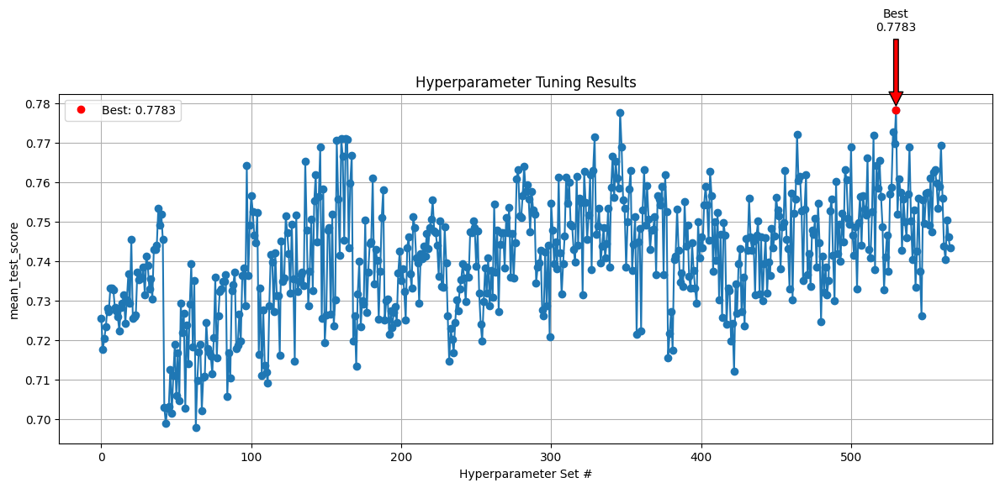

In [46]:
data = plot_hyperparam_search_results(grid_search.cv_results_, xtick_step=100)

In [47]:
grid_search.best_params_

{'LGBMClassifier__learning_rate': 0.1,
 'LGBMClassifier__max_depth': 7,
 'LGBMClassifier__min_child_samples': 10,
 'LGBMClassifier__n_estimators': 20,
 'LGBMClassifier__num_leaves': 31}

In [48]:
grid_search_best_model = grid_search.best_estimator_

[LightGBM] [Info] Number of positive: 337, number of negative: 154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686354 -> initscore=0.783130
[LightGBM] [Info] Start training from score 0.783130
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

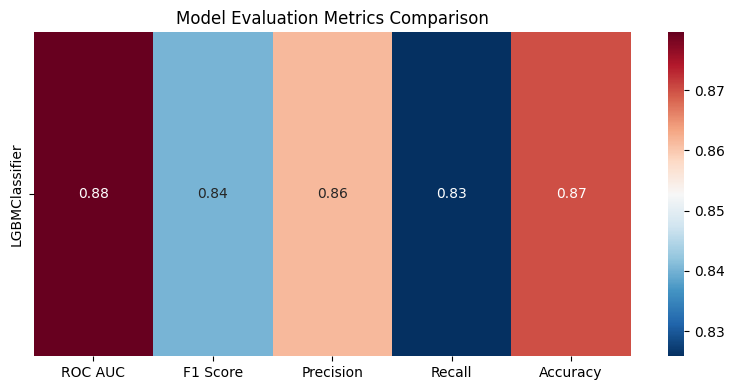

In [49]:
grid_search_metrics = train_evaluate_models(
    models=[('LGBMClassifier', grid_search_best_model)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [50]:
grid_search_metrics

,ROC AUC,F1 Score,Precision,Recall,Accuracy
LGBMClassifier,0.879567,0.84026,0.861435,0.825851,0.869919


(<Figure size 800x400 with 2 Axes>,
                  ROC AUC  F1 Score  Precision    Recall  Accuracy
 LGBMClassifier  0.027554  0.065534     0.0902  0.047059  0.065041)

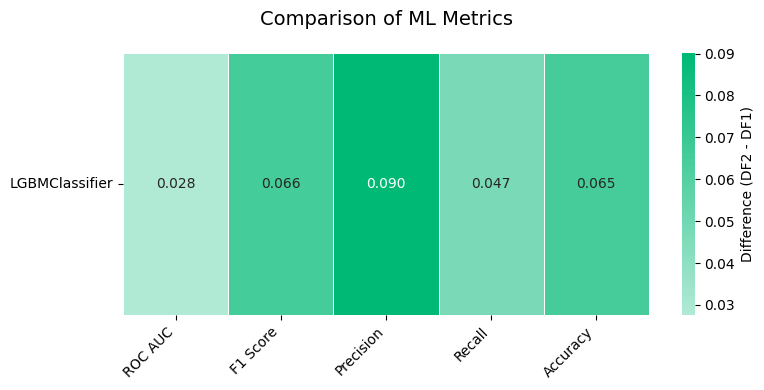

In [51]:
compare_metrics_heatmap(initial_metrics, grid_search_metrics)

### 2.2 Randomized search

In [52]:
param_dist = {
    "LGBMClassifier__num_leaves": sp_randint(7, 32), 
    "LGBMClassifier__max_depth": sp_randint(3, 8), 
    "LGBMClassifier__min_child_samples": sp_randint(5, 10, 20),
    
    "LGBMClassifier__learning_rate": sp_uniform(0.01, 0.1),
    "LGBMClassifier__n_estimators": sp_randint(10, 200),  
}

In [53]:
randomized_search = RandomizedSearchCV(
    random_state=SEED,
    estimator=pipeline,
    param_distributions=param_dist,
    n_iter=100,
    scoring='roc_auc',
    cv=cv,
    n_jobs=1,
    verbose=3
)

In [54]:
randomized_search_start = timer()
randomized_search.fit(X_train, y_train)
randomized_search_end = timer()

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[LightGBM] [Info] Number of positive: 269, number of negative: 123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686224 -> initscore=0.782527
[LightGBM] [Info] Start training from score 0.782527
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

In [55]:
print(f"Total time: {randomized_search_end - randomized_search_start:.2f} seconds")

Total time: 45.54 seconds


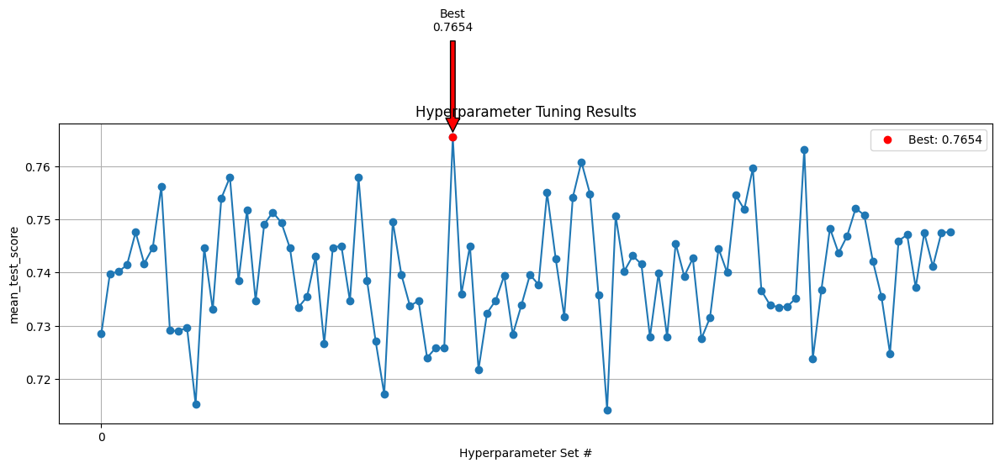

In [56]:
data = plot_hyperparam_search_results(randomized_search.cv_results_, xtick_step=100)

In [57]:
randomized_search.best_params_

{'LGBMClassifier__learning_rate': 0.07335297107608947,
 'LGBMClassifier__max_depth': 5,
 'LGBMClassifier__min_child_samples': 25,
 'LGBMClassifier__n_estimators': 133,
 'LGBMClassifier__num_leaves': 12}

[LightGBM] [Info] Number of positive: 337, number of negative: 154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686354 -> initscore=0.783130
[LightGBM] [Info] Start training from score 0.783130
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

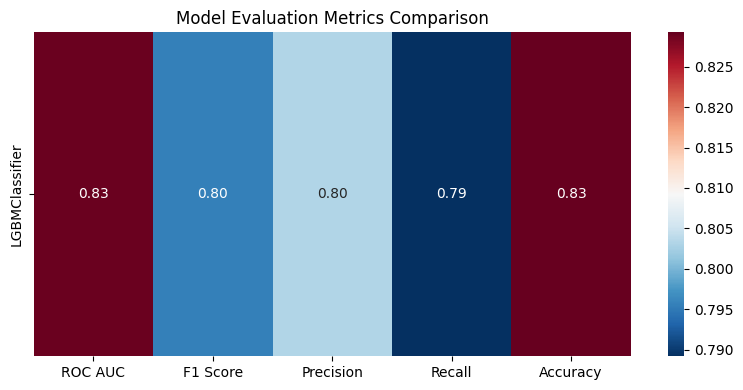

In [58]:
randomized_search_metrics = train_evaluate_models(
    models=[('LGBMClassifier', randomized_search.best_estimator_)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [59]:
randomized_search_metrics

,ROC AUC,F1 Score,Precision,Recall,Accuracy
LGBMClassifier,0.829102,0.795471,0.803247,0.789164,0.829268


(<Figure size 800x400 with 2 Axes>,
                 ROC AUC  F1 Score  Precision    Recall  Accuracy
 LGBMClassifier -0.02291  0.020745   0.032012  0.010372   0.02439)

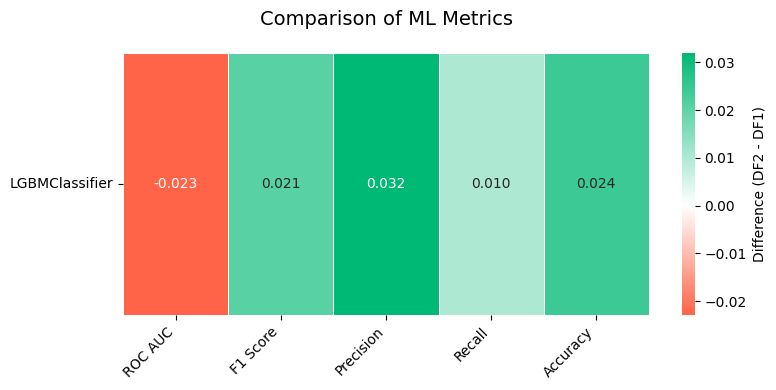

In [60]:
compare_metrics_heatmap(initial_metrics, randomized_search_metrics)

### 2.3 Bayes Search

In [61]:
param_bayes = {
    "LGBMClassifier__num_leaves": Integer(7, 31), 
    "LGBMClassifier__max_depth": Integer(3, 7),  
    "LGBMClassifier__min_child_samples": Integer(5, 20), 
    
    # Логарифмическая шкала используется потому что:
    # 1) learning_rate обычно варьируется в порядках величины (0.001-0.1)
    # 2) Логарифмирование дает более равномерный поиск в широком диапазоне значений
    # 3) Разница между 0.01 и 0.02 часто значительнее, чем между 0.1 и 0.11
    "LGBMClassifier__learning_rate": Real(0.01, 0.1, prior='log-uniform'),
    
    "LGBMClassifier__n_estimators": Integer(10, 200), 
}

In [63]:
bayes_search = BayesSearchCV(
    random_state=SEED,
    estimator=pipeline,
    search_spaces=param_bayes,
    n_iter=100, 
    cv=cv,      
    scoring='roc_auc',  
    optimizer_kwargs={'base_estimator': 'GP'}, 
    verbose=3,
    n_jobs=1 
)

In [64]:
bayes_search_start = timer()
bayes_search.fit(X_train, y_train)
bayes_search_end = timer()

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[LightGBM] [Info] Number of positive: 269, number of negative: 123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686224 -> initscore=0.782527
[LightGBM] [Info] Start training from score 0.782527
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

In [65]:
print(f"Total time: {bayes_search_end - bayes_search_start:.2f} seconds")

Total time: 243.55 seconds


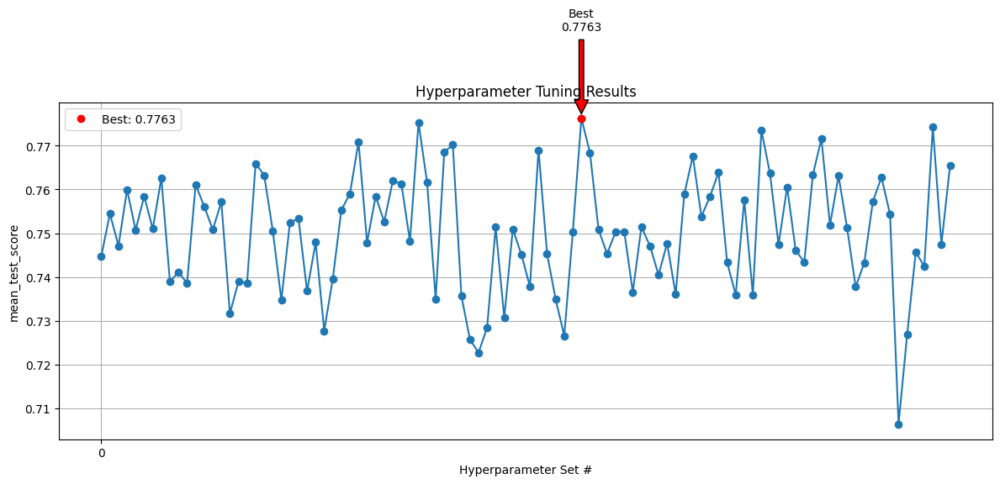

In [66]:
data = plot_hyperparam_search_results(bayes_search.cv_results_, xtick_step=100)

In [67]:
bayes_search.best_params_

OrderedDict([('LGBMClassifier__learning_rate', 0.02751632640326286),
             ('LGBMClassifier__max_depth', 7),
             ('LGBMClassifier__min_child_samples', 14),
             ('LGBMClassifier__n_estimators', 198),
             ('LGBMClassifier__num_leaves', 31)])

[LightGBM] [Info] Number of positive: 337, number of negative: 154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.686354 -> initscore=0.783130
[LightGBM] [Info] Start training from score 0.783130
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

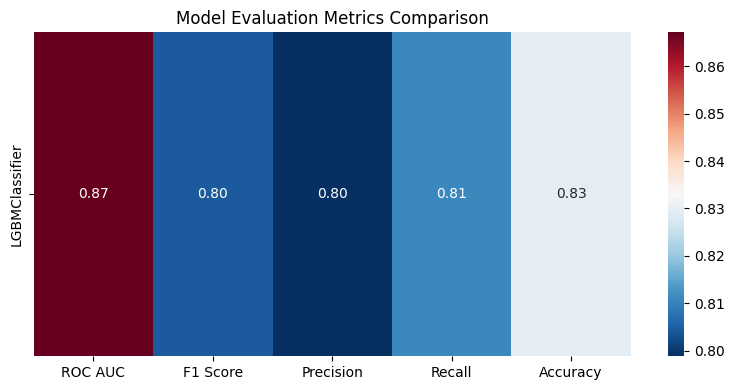

In [69]:
bayes_search_metrics = train_evaluate_models(
    models=[('LGBMClassifier', bayes_search.best_estimator_)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [70]:
bayes_search_metrics

,ROC AUC,F1 Score,Precision,Recall,Accuracy
LGBMClassifier,0.867183,0.804214,0.79878,0.810991,0.829268


(<Figure size 800x400 with 2 Axes>,
                 ROC AUC  F1 Score  Precision    Recall  Accuracy
 LGBMClassifier  0.01517  0.029489   0.027546  0.032198   0.02439)

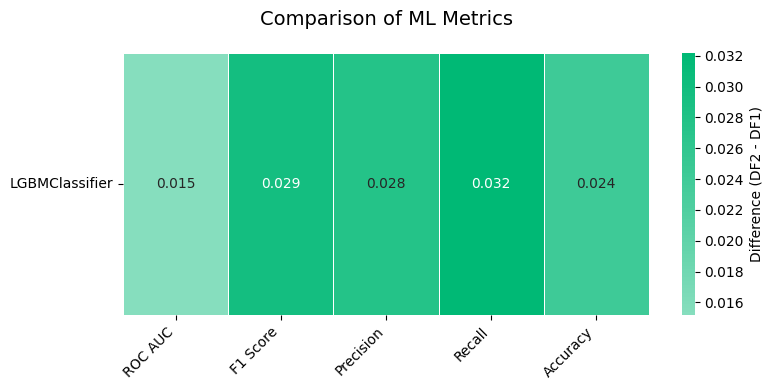

In [71]:
compare_metrics_heatmap(initial_metrics, bayes_search_metrics)

(<Figure size 800x400 with 2 Axes>,
                  ROC AUC  F1 Score  Precision    Recall  Accuracy
 LGBMClassifier -0.012384 -0.036045  -0.062655 -0.014861  -0.04065)

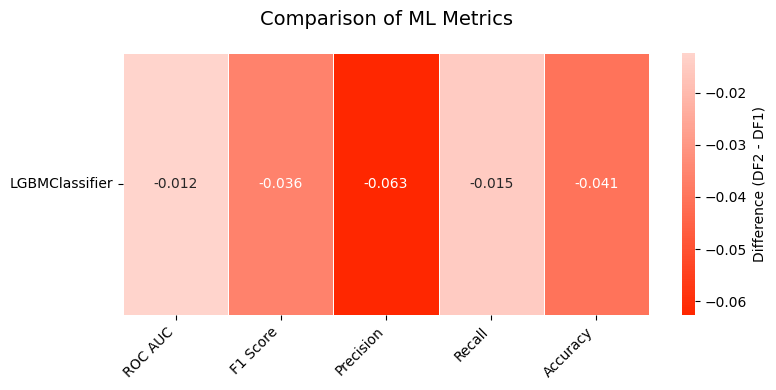

In [72]:
compare_metrics_heatmap(grid_search_metrics, bayes_search_metrics)

Вообще говоря, тестовая выборка нужна только затем, чтобы оценить результат финальной модели. На ее основе нельзя принимать никаких решений, для этого есть валидационная. Но я все же оставил тесты для разных методов для наглядности. Но даже по валидационной выборке Grid Search подобрал лучшие гиперпараметры, хоть и разница между подходами получилась небольшая. Также в Randomized Search и Bayes Search можно увеличить число итераций и возможно добиться лучших результатов. 